# Visualizing high dimensional TEDS data

In [2]:
import matplotlib.pyplot as plt
import pandas as pd

import seaborn as sns

import numpy as np
import scipy.stats as ss

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [7]:
df=pd.read_csv('__TEDSCountyLevel2008-2017_2.csv')

In [3]:
%matplotlib inline

In [8]:
df.head(10)

,Alcohol,Amphetamine,Barbiturates,Benzine,Age,State,Cocaine,County Name,Gender,Hal,...,OTC Primary,Other Drugs Primary,Pain Killers,Pain Killers Primary,PCP Primary,Race.1,Rx,Rx Primary,Stimulants Primary,Trnq Primary
0,0,0,0,0,18-24,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
1,1,0,0,0,55+,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
2,1,0,0,0,18-24,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
3,0,0,0,0,55+,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
4,0,0,0,0,55+,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
5,1,0,0,0,25-34,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
6,1,0,0,0,35-44,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
7,1,0,0,0,25-34,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
8,1,0,0,0,0-18,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0
9,1,0,0,0,25-34,Indiana,0,Pulaski,Male,0,...,0,0,0,0,0,White,0,0,0,0


In [9]:
#Limit the number of features
features = ['Year','County Name','Gender','Race','Age','Alcohol','Heroin','Marijuana','Opioid','Cocaine','Other Drugs','Pain Killers', 'Methamphetamine', 'Synthetic Drugs']
df_subset = df[features]
df_subset.head()

,Year,County Name,Gender,Race,Age,Alcohol,Heroin,Marijuana,Opioid,Cocaine,Other Drugs,Pain Killers,Methamphetamine,Synthetic Drugs
0,2009,Pulaski,Male,White,18-24,0,0,1,0,0,0,0,0,0
1,2009,Pulaski,Male,White,55+,1,0,0,0,0,0,0,0,0
2,2009,Pulaski,Male,White,18-24,1,0,1,0,0,0,0,0,0
3,2009,Pulaski,Male,White,55+,0,0,1,0,0,0,0,0,0
4,2009,Pulaski,Male,White,55+,0,0,1,0,0,0,0,0,0


In [10]:
import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [11]:
#Create a dataset for the 9 substances to use in correlations
features = ['Alcohol','Heroin','Marijuana','Opioid','Cocaine','Other Drugs','Pain Killers', 'Methamphetamine', 'Synthetic Drugs']
df_only_features = df_subset[features]
df_only_features.head()

,Alcohol,Heroin,Marijuana,Opioid,Cocaine,Other Drugs,Pain Killers,Methamphetamine,Synthetic Drugs
0,0,0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0
2,1,0,1,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0


In [12]:
n_samples, n_features = df_only_features.shape
print(n_samples)
print(n_features)

335866
9


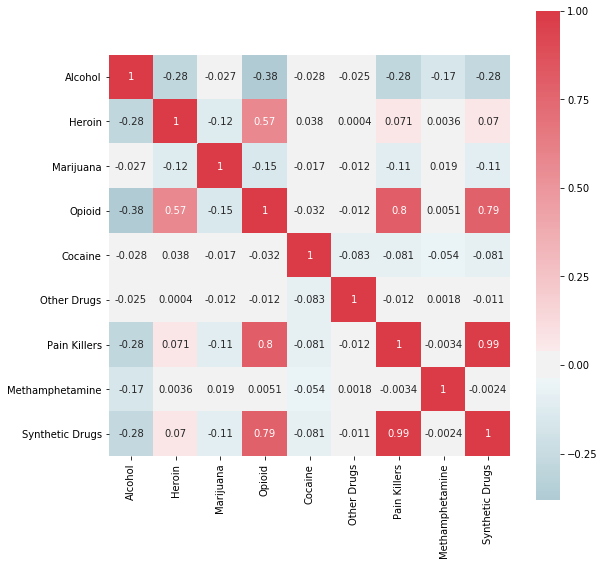

In [11]:
#Check correlation between substances
import seaborn as sns

f, ax = plt.subplots(figsize=(9, 9))
corr = df_only_features.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), center=0,
            square=True, ax=ax,annot=True)

There is strong correlation between Pain Killers and Synthetic Drugs, supported by the Opioids. Heroin appears in 57% of the cases with Opioids. Alcohol is slightly negatively correlates with all four of them. 

#### Remarkably, there appears to be no appreciable correlation between opioid use and such commonly accepted and complementary socio-economic markers as alcohol, marijuana, or methamphetamine use. In fact, these three factors are likely to be biased towards older population (alcohol), younger population (marijuana) and underprivileged rural population (methamphetamine). 
#### Thus, it appears that opioid abuse have roots that are different from the common socio-economic maladies reflected in these three markers. 


In [13]:
df_subset['County Name'].nunique()

93

In [13]:
df_subset['Year'].nunique()

10

In [14]:
# Total number of records
len(df_subset)

335866

In [15]:
#How many records per year
df_subset['Year'].value_counts()

2017    37459
2015    34739
2011    34677
2014    34470
2012    33984
2013    33616
2016    33170
2009    32049
2010    31827
2008    29875
Name: Year, dtype: int64

In [15]:
#How many records per county 
df_subset['County Name'].value_counts()

Marion          41678
Lake            25329
Allen           16940
Vanderburgh     14085
Monroe          13842
Saint Joseph    13359
Delaware        10453
Madison          9594
Elkhart          8309
Hamilton         8033
Vigo             7895
Howard           6235
Bartholomew      6037
Porter           5455
LaPorte          5086
Morgan           5057
Lawrence         4557
Tippecanoe       4514
Wayne            4391
Grant            4241
Dearborn         3981
Clark            3857
Hendricks        3488
Knox             3350
Noble            3024
Montgomery       3006
Warrick          2969
Kosciusko        2946
Jefferson        2888
Johnson          2834
                ...  
Perry            1407
Rush             1281
Shelby           1246
Vermillion       1241
Wells            1195
Jay              1193
Orange           1174
Franklin         1115
Huntington       1107
Parke            1084
Whitley          1031
Carroll           967
Brown             922
Pulaski           906
Jasper    

In [16]:
# General method to variably group the data
def group_dataset(df, col1, col2):
    df_grouped=df.groupby([col1,col2])
    return df_grouped

In [17]:
#Group by Year and County
df_grouped=group_dataset(df_subset, 'Year','County Name')

#Excluded pain killers and synthetic drugs as highly correclated with opioids
feature=['Alcohol','Heroin','Marijuana','Opioid','Cocaine','Other Drugs','Methamphetamine']
df_grouped=df_grouped[feature].mean()

df_grouped.head()

Alcohol    Heroin  Marijuana    Opioid   Cocaine  \
Year County Name                                                      
2008 Adams        0.905263  0.021053   0.684211  0.105263  0.231579   
     Allen        0.863495  0.012480   0.641186  0.048362  0.325273   
     Bartholomew  0.651106  0.004914   0.542998  0.226044  0.255528   
     Benton       0.840000  0.000000   0.520000  0.040000  0.160000   
     Blackford    0.833333  0.000000   0.620370  0.157407  0.175926   

                  Other Drugs  Methamphetamine  
Year County Name                                
2008 Adams                0.0         0.010526  
     Allen                0.0         0.017161  
     Bartholomew          0.0         0.299754  
     Benton               0.0         0.040000  
     Blackford            0.0         0.009259

In [18]:
#Group by County
df_grouped_c=group_dataset(df_subset,'County Name', 'Year')

#exclude pain killers and synthetic drugs as highly correclated with opioids
feature=['Alcohol','Heroin','Marijuana','Opioid','Cocaine','Other Drugs','Methamphetamine']
df_grouped_c=df_grouped_c[feature].mean()

df_grouped_c.head()

Alcohol    Heroin  Marijuana    Opioid   Cocaine  \
County Name Year                                                      
Adams       2008  0.905263  0.021053   0.684211  0.105263  0.231579   
            2009  0.877863  0.007634   0.549618  0.099237  0.175573   
            2010  0.613497  0.141104   0.496933  0.300613  0.184049   
            2011  0.655405  0.141892   0.540541  0.331081  0.155405   
            2012  0.756098  0.073171   0.528455  0.203252  0.178862   

                  Other Drugs  Methamphetamine  
County Name Year                                
Adams       2008     0.000000         0.010526  
            2009     0.000000         0.030534  
            2010     0.147239         0.042945  
            2011     0.108108         0.060811  
            2012     0.138211         0.040650

In [19]:
# Group by Year to genralize the output
df_grouped_year1=df_subset.groupby('Year')
df_grouped_year1=df_grouped_year1[feature].mean()

df_grouped_year1.head()

,Alcohol,Heroin,Marijuana,Opioid,Cocaine,Other Drugs,Methamphetamine
Year,,,,,,,
2008,0.661891,0.038226,0.506644,0.155213,0.223397,0.000000,0.087464
2009,0.682798,0.049237,0.514837,0.177821,0.194359,0.000000,0.091235
2010,0.632168,0.055833,0.490998,0.186006,0.157602,0.119553,0.096962
2011,0.606050,0.068662,0.483837,0.220607,0.146899,0.138593,0.103556
2012,0.590837,0.094191,0.471398,0.275012,0.156809,0.154926,0.112612


In [20]:
# General method to pivot by two predictors
def create_pivot_df(df, col_name, index_name, val_name):
    pivot_df = df.pivot_table(columns=col_name, index= index_name, values= val_name, aggfunc='mean')
    return pivot_df

In [21]:
#create a pivot table for alcohol
create_pivot_df(df_grouped,col_name='Year',index_name='County Name', val_name='Alcohol').head()

Year,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
County Name,,,,,,,,,,
Adams,0.905263,0.877863,0.613497,0.655405,0.756098,0.812030,0.805195,0.697143,0.559322,0.514905
Allen,0.863495,0.834094,0.812057,0.794048,0.672963,0.736813,0.729648,0.674190,0.665637,0.619924
Bartholomew,0.651106,0.605505,0.442708,0.400815,0.458841,0.522551,0.501475,0.410745,0.345955,0.318925
Benton,0.840000,0.850000,0.684211,0.794118,0.852941,0.659091,0.708333,0.750000,0.780000,0.627451
Blackford,0.833333,0.787234,0.216216,0.523810,0.519231,0.386364,0.440678,0.454545,0.378049,0.333333


In [22]:
def draw_heatmap(df, nrows, ncols):
    f, ax = plt.subplots(figsize=(nrows, ncols))    
    sns.heatmap(df,  cmap=sns.cubehelix_palette(8, start=.5, rot=-.75),ax=ax,xticklabels=2, square=True, vmin=0, vmax=.9)

In [23]:
def draw_heatmap_corr(df, nrows, ncols):
    f, ax = plt.subplots(figsize=(nrows, ncols)) 
    df=df.corr()
    sns.heatmap(df,  cmap=sns.diverging_palette(220, 10, as_cmap=True), center=0,ax=ax, square=True,annot=True,cbar_kws={"shrink": .5})  

In [24]:
#Transpose the matrix
df_grouped_year_T= df_grouped_year1.T
df_grouped_year_T

Year,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Alcohol,0.661891,0.682798,0.632168,0.606050,0.590837,0.585792,0.559066,0.528743,0.501326,0.469954
Heroin,0.038226,0.049237,0.055833,0.068662,0.094191,0.105396,0.121787,0.156625,0.185680,0.207187
Marijuana,0.506644,0.514837,0.490998,0.483837,0.471398,0.476172,0.478648,0.483462,0.483389,0.484690
Opioid,0.155213,0.177821,0.186006,0.220607,0.275012,0.303248,0.314244,0.339273,0.359029,0.371046
Cocaine,0.223397,0.194359,0.157602,0.146899,0.156809,0.131277,0.112446,0.106825,0.105788,0.107851
Other Drugs,0.000000,0.000000,0.119553,0.138593,0.154926,0.165516,0.177894,0.202654,0.223184,0.227262
Methamphetamine,0.087464,0.091235,0.096962,0.103556,0.112612,0.121995,0.141514,0.159936,0.196955,0.248538


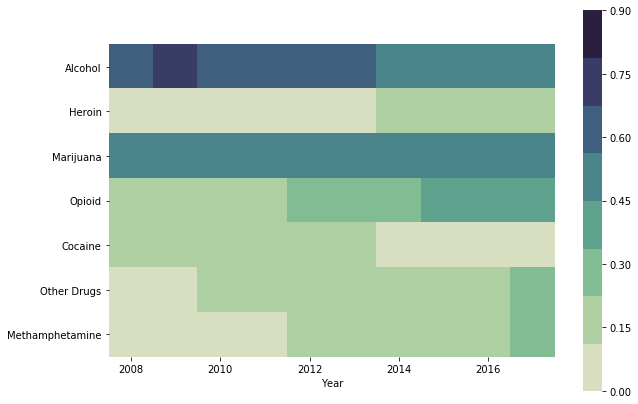

In [27]:
# Show a trend relative to other substances
draw_heatmap(df_grouped_year_T, 10, 7)

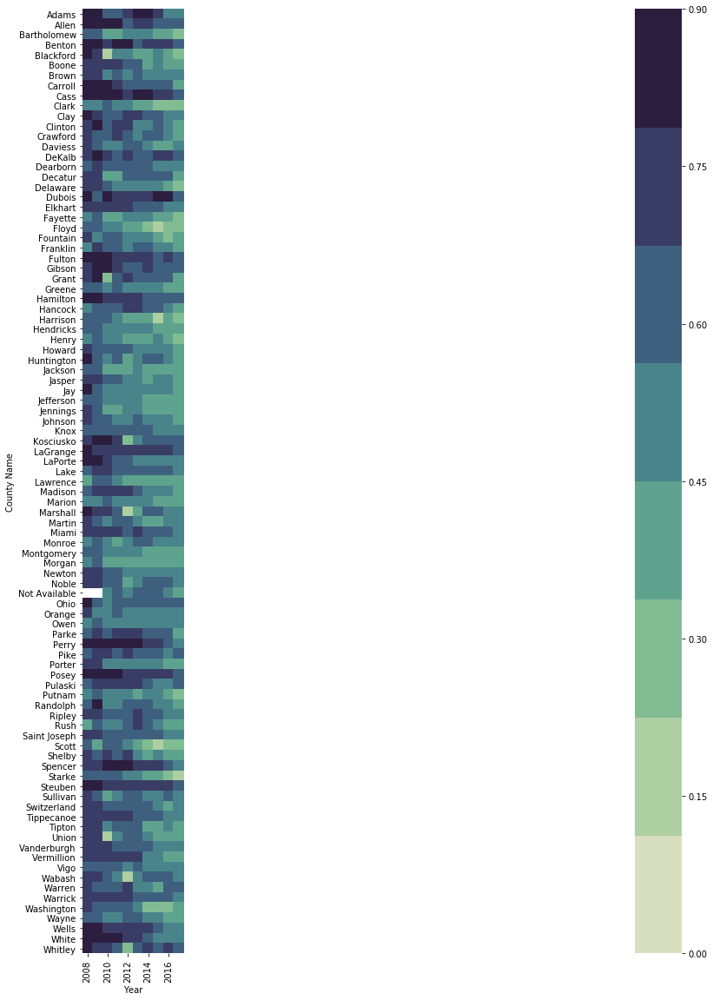

In [28]:
# Draw a heatmap by County for Alcohol
draw_heatmap(
create_pivot_df(df_grouped,'Year','County Name', 'Alcohol'), 186, 20)

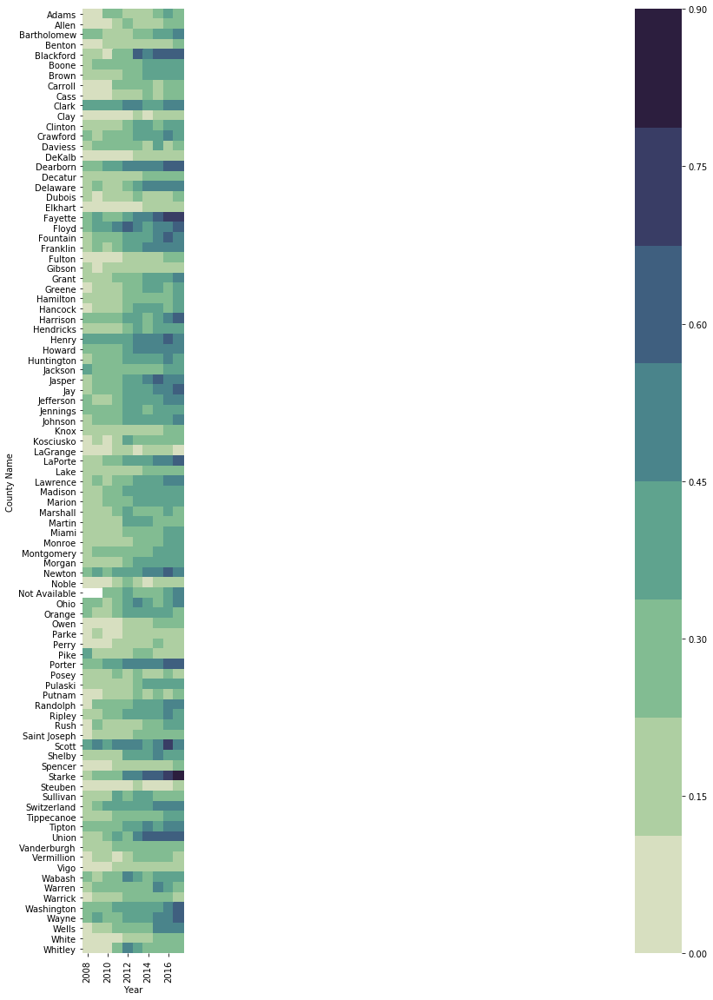

In [29]:
#Opioid
draw_heatmap(create_pivot_df(df_grouped,'Year','County Name', 'Opioid'), 186, 20)

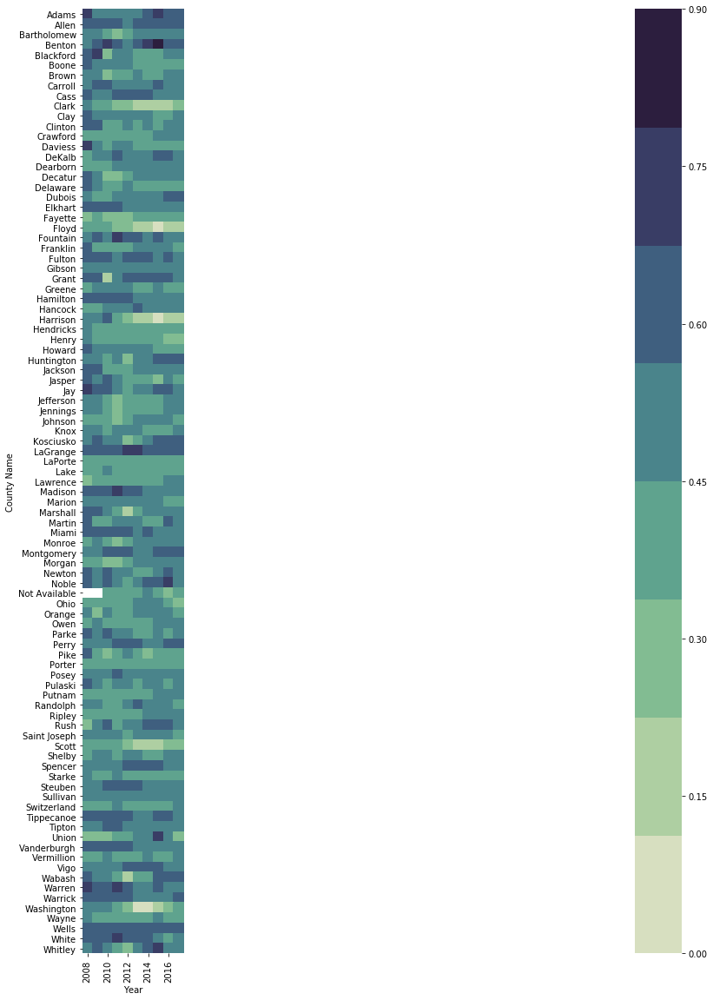

In [30]:
#Marijuana
draw_heatmap(create_pivot_df(df_grouped,'Year','County Name', 'Marijuana'), 186, 20)

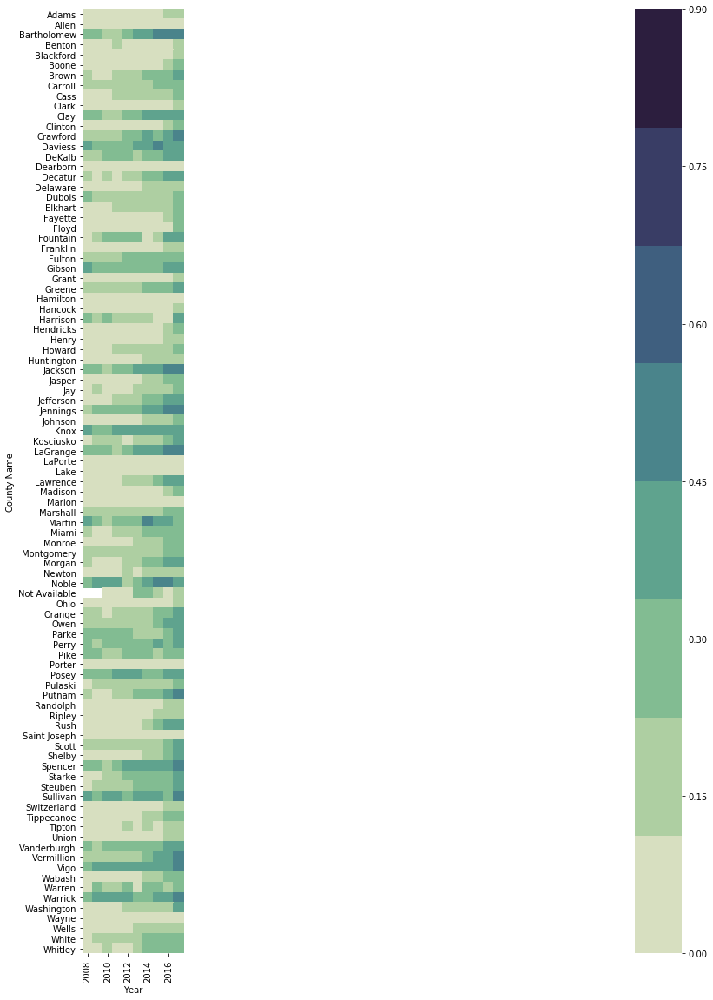

In [31]:
# Methamphetamine
draw_heatmap(create_pivot_df(df_grouped,'Year','County Name', 'Methamphetamine'), 186, 20)

#### From the four heatmaps above, one could infer the following observations: 
- while Alcohol remains the most commonly abused substance, its dominance is vaning as the prevalence of other substances, especially opiods and methamphethamine increases. At the same time, marijuana abuse remains fairly stable.  

### Suplimentary Analysis: Identify any years that differ from the majority

In [ ]:
draw_heatmap_corr(create_pivot_df(df_grouped,'Year','County Name', 'Alcohol'), 10,10)

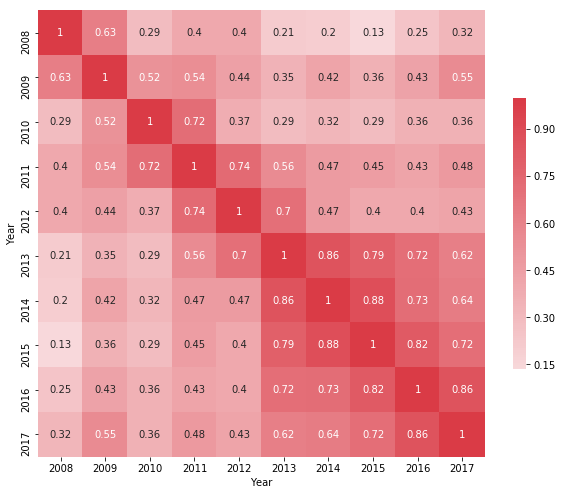

In [33]:
#Marijuana
draw_heatmap_corr(create_pivot_df(df_grouped,'Year','County Name', 'Marijuana'), 10,10)

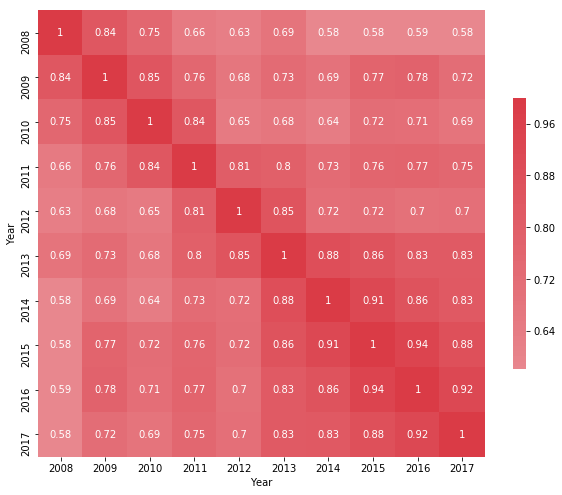

In [34]:
#Opioids
draw_heatmap_corr(create_pivot_df(df_grouped,'Year','County Name', 'Opioid'), 10,10)

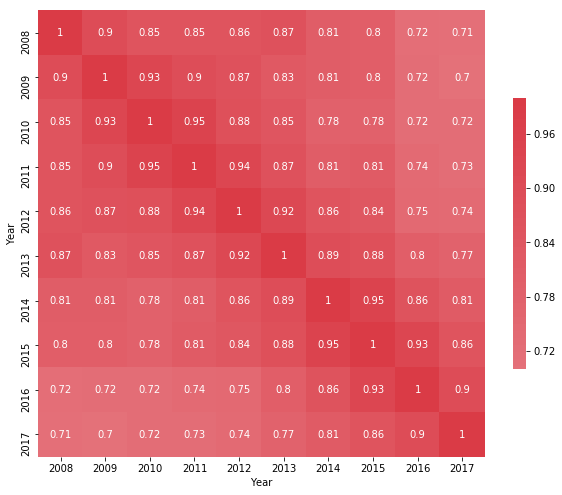

In [35]:
#Methamphetamine
draw_heatmap_corr(create_pivot_df(df_grouped,'Year','County Name', 'Methamphetamine'), 10,10)

Beginning 2012 the usage patterns became very similar for the malority of the subjects that requested treatment in Indiana.

### Suplimentary Analysis: Identify counties that differ from the majority

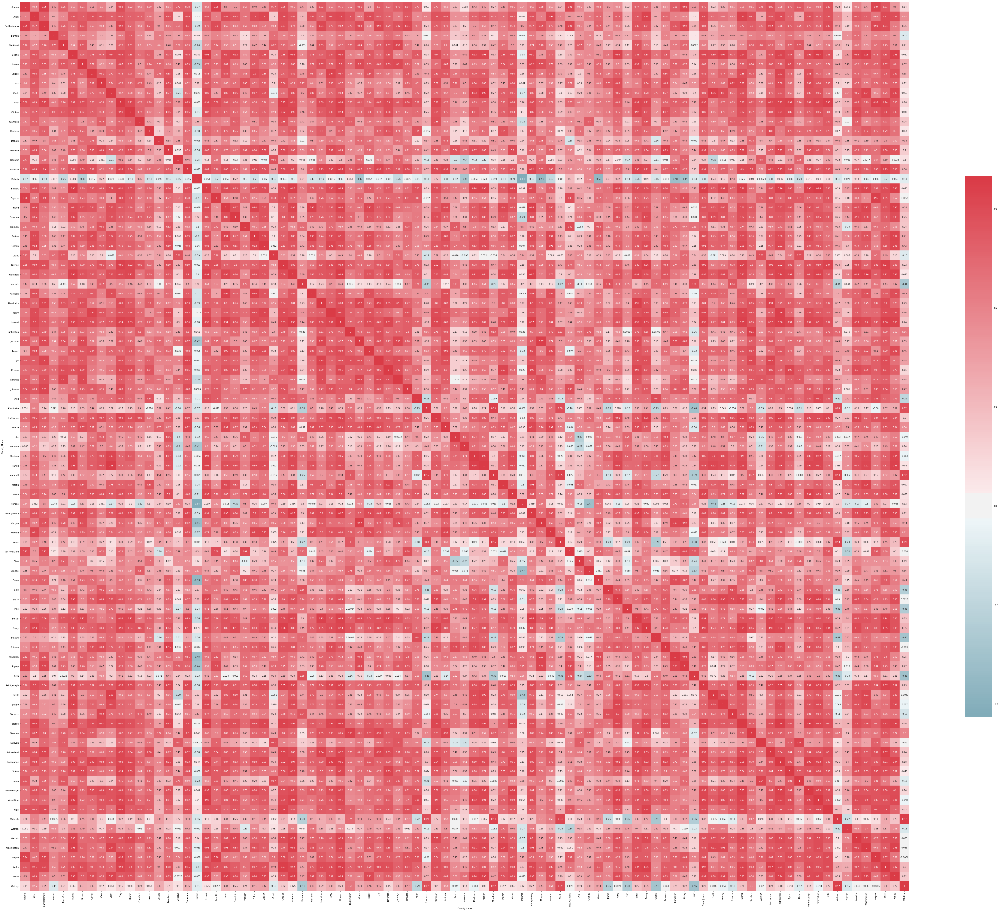

In [37]:
draw_heatmap_corr(create_pivot_df(df_grouped,'County Name','Year', 'Alcohol'), 93,93)

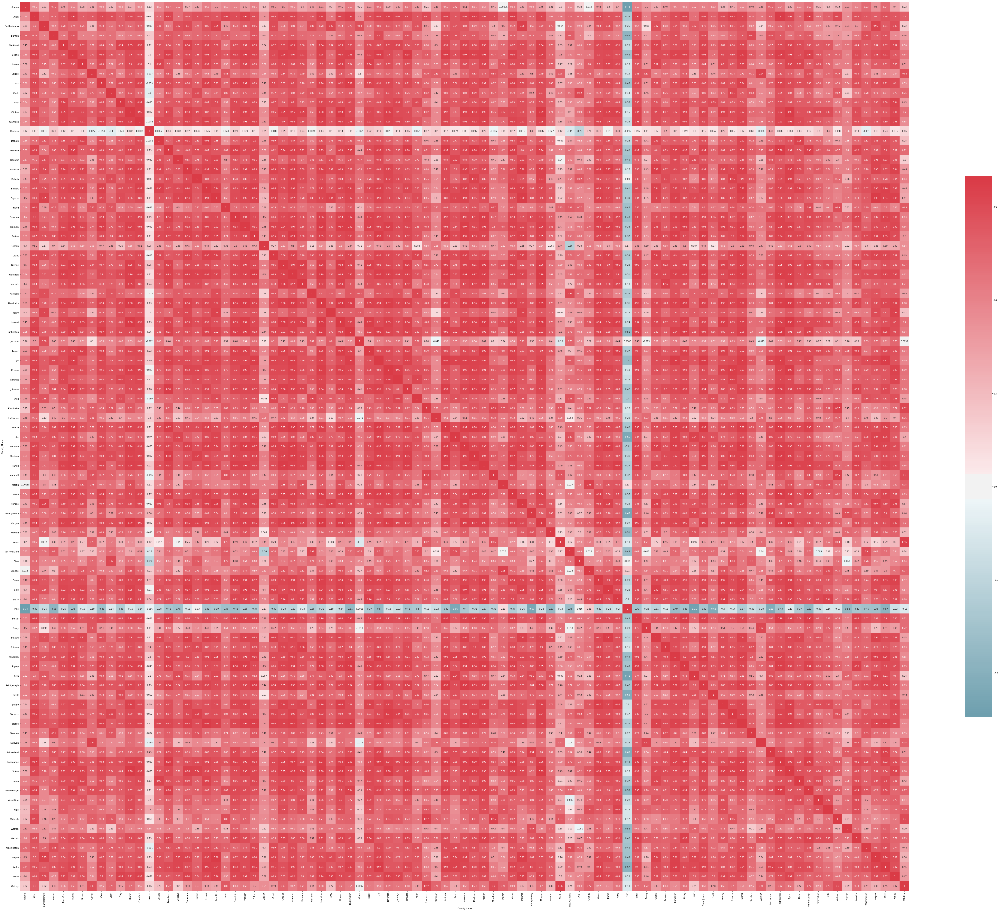

In [38]:
draw_heatmap_corr(create_pivot_df(df_grouped,'County Name','Year', 'Opioid'), 93,93)

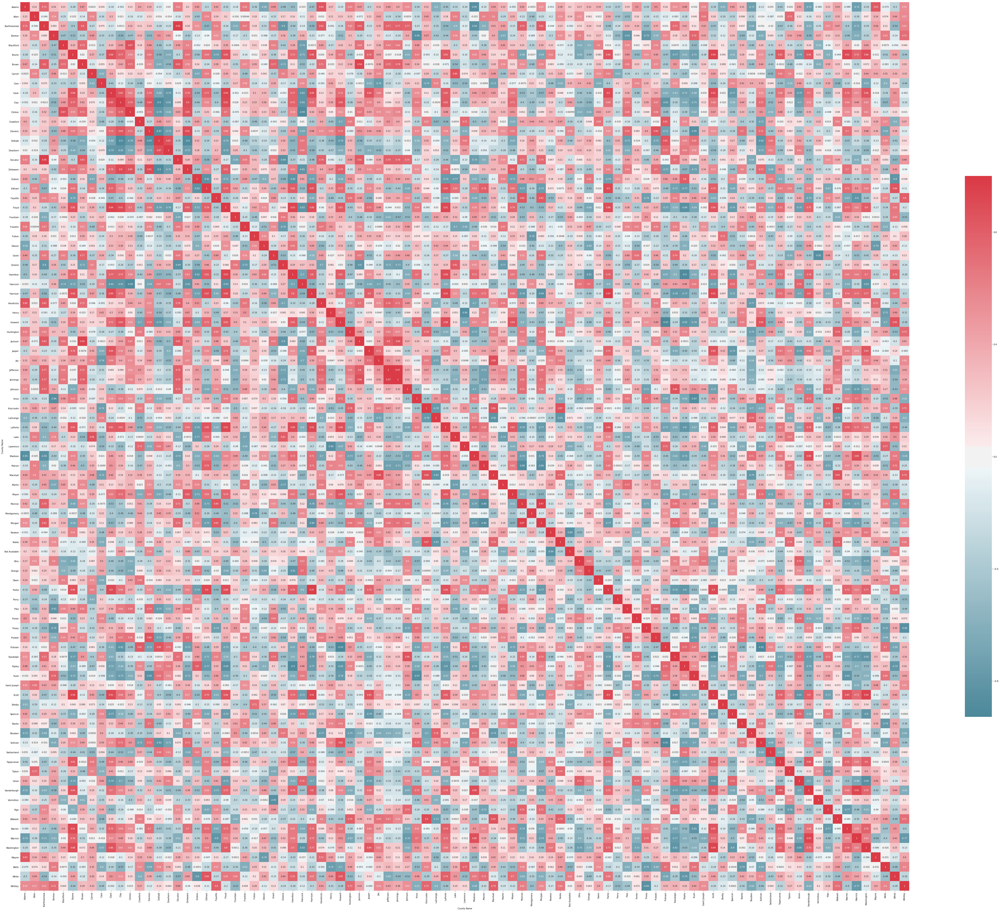

In [39]:
draw_heatmap_corr(create_pivot_df(df_grouped,'County Name','Year', 'Marijuana'), 93,93)

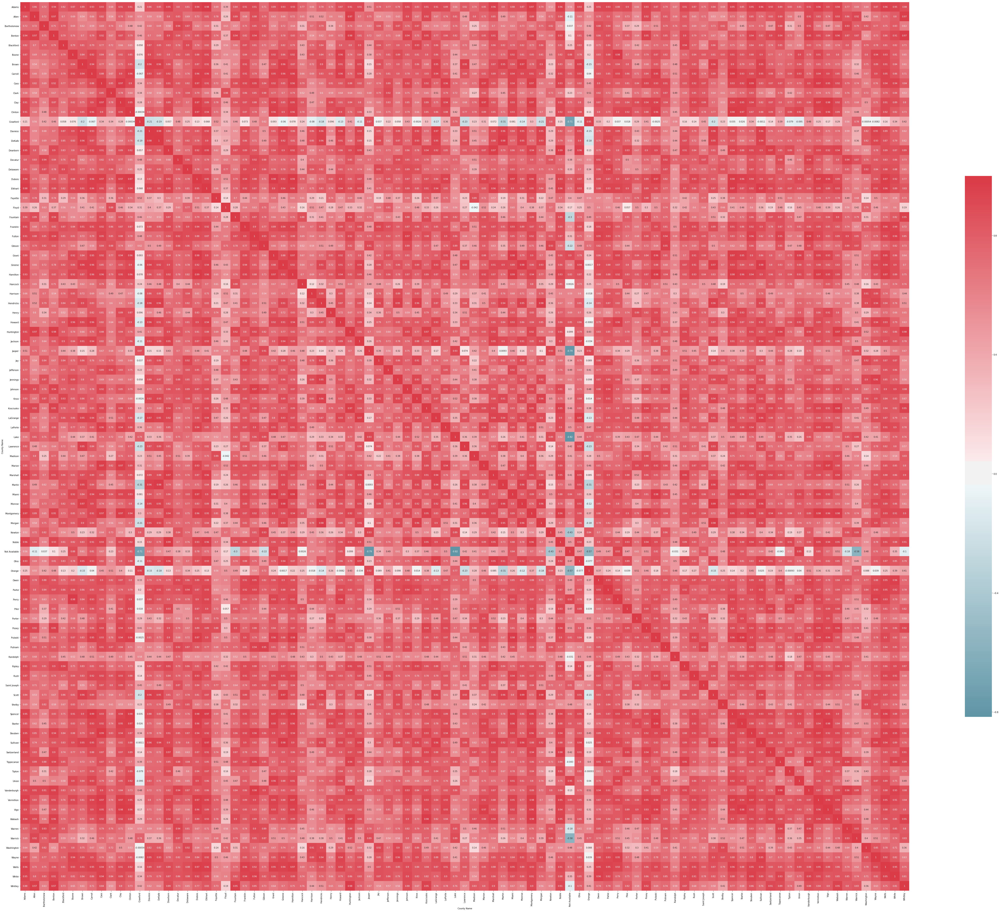

In [40]:
draw_heatmap_corr(create_pivot_df(df_grouped,'County Name','Year', 'Other Drugs'), 93,93)

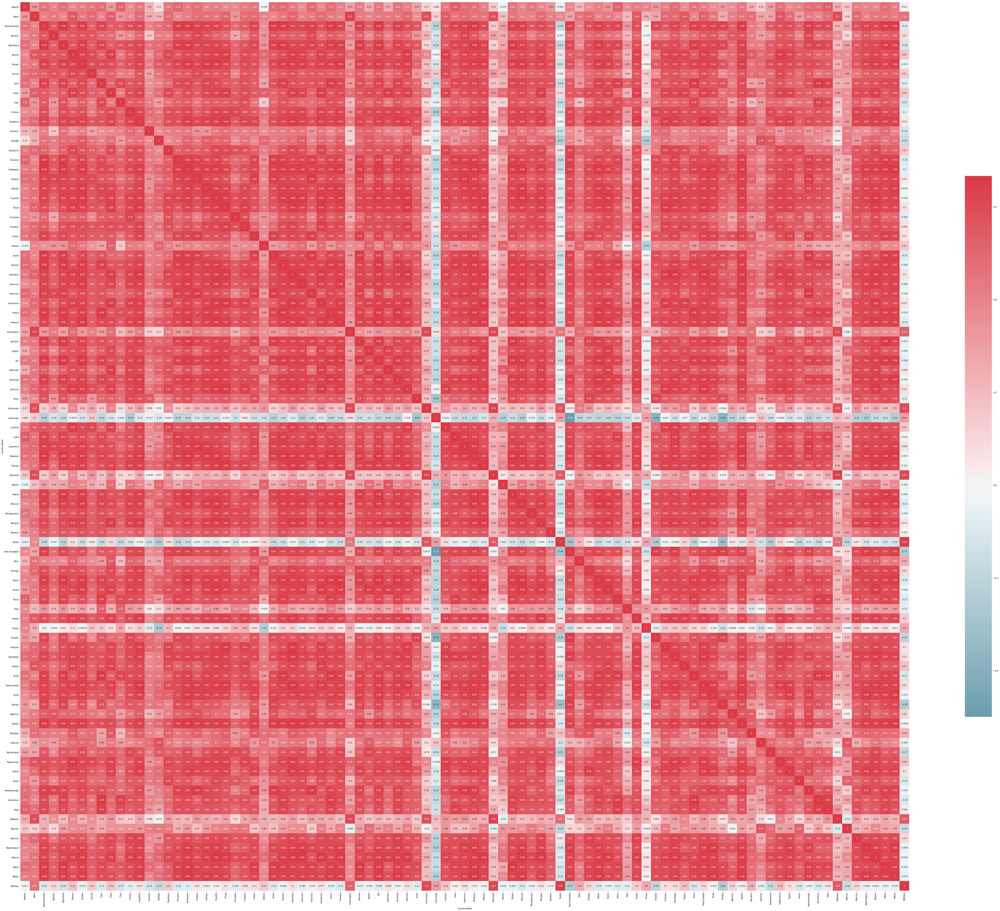

In [41]:
draw_heatmap_corr(create_pivot_df(df_grouped,'County Name','Year', 'Heroin'), 93,93)

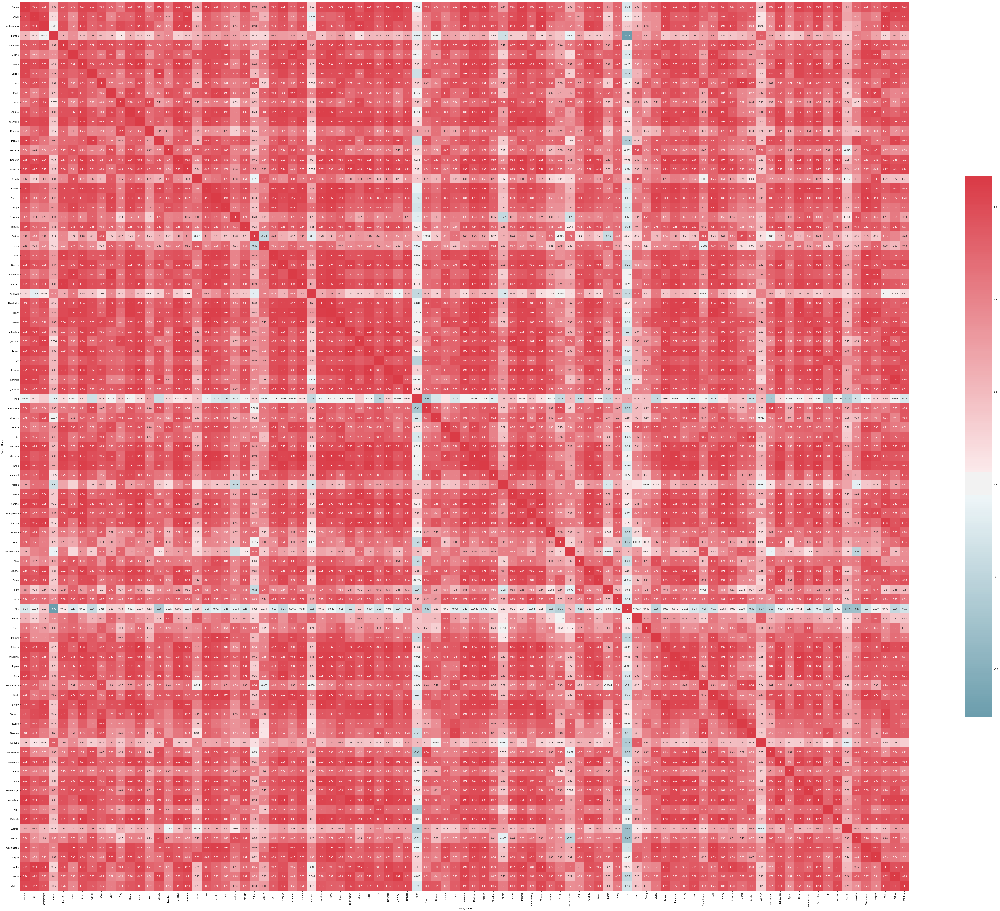

In [42]:
draw_heatmap_corr(create_pivot_df(df_grouped,'County Name','Year', 'Methamphetamine'), 93,93)

## Suplimentary analisys: PCA 

The [principal component analysis (PCA)](http://setosa.io/ev/principal-component-analysis/) is the most basic dimensionality reduction method. To run the PCA we want to isolate only the numerical columns. 

In [43]:
from sklearn.decomposition import PCA
pca = PCA() 

Now I ran `fit()` method to identify principal components. 

In [44]:
pca_df_fitted = pca.fit(df_only_features)
print(pca.components_)


[[-3.85284978e-01  1.74017452e-01 -1.44132829e-01  5.72548369e-01
  -2.69179141e-02 -9.45944737e-04  4.88667622e-01  2.68324235e-02
   4.82126552e-01]
 [-4.18457857e-01 -5.05321504e-03  9.00800758e-01 -1.84296925e-02
  -5.53315489e-03  1.53651275e-03 -2.34787354e-02  1.09207683e-01
  -2.39850374e-02]
 [ 7.11756112e-01 -2.43212736e-01  3.74058306e-01  9.21887106e-02
  -1.39977393e-01 -4.67858705e-02  3.29558300e-01 -2.17148697e-01
   3.29070826e-01]
 [ 6.54654403e-02  2.33536949e-01  7.81258265e-02  1.44714164e-01
   6.66987977e-01 -5.86190546e-01 -6.12216977e-02 -3.43352728e-01
  -6.32252001e-02]
 [ 7.12073209e-02  4.07014556e-01  9.88869180e-02  2.09251566e-01
   5.82755415e-02  6.54588384e-01 -1.35008442e-01 -5.53985972e-01
  -1.36726374e-01]
 [-2.01654654e-01 -5.55680657e-01 -7.19214685e-02 -2.79439087e-01
   5.74989672e-01  3.75006655e-01  1.92924758e-01 -1.44138780e-01
   1.95080605e-01]
 [ 3.46163005e-01  2.35182719e-01  8.23741063e-02  1.93313001e-01
   4.47977083e-01  2.9166627

'-Other Drugs', Marijuana,Opioid+Alcohol, Marijuana+Cocaine, Marijuana+Alcohol, -Marijuana-Heroin, Marijuana+Methamphetamine

In [45]:
print(pca.explained_variance_)


[0.52332706 0.25520259 0.20435398 0.13614426 0.12185475 0.1103172
 0.10171866 0.00989851 0.00189358]


In [46]:
pca_df_fitted.explained_variance_ratio_

array([0.35729042, 0.17423414, 0.13951833, 0.0929496 , 0.08319374,
       0.07531672, 0.06944625, 0.006758  , 0.0012928 ])

In [47]:
pca.components_.shape

(9, 9)

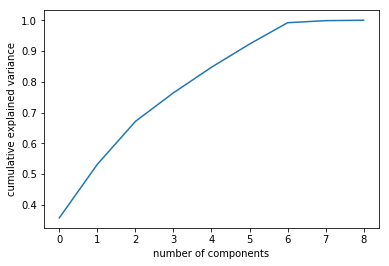

In [48]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

The first six components capture more than 95% of the variance in original dataset. This means that the PCA is not very effective on this dataset and six components will provide approximation for the rest of the dimensions. 